In [1]:
import sympy as sy
import pydy.system as dy
from sympy import *
import sympy.physics.mechanics as me
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import fsolve
from pydy.system import System

In [2]:
#Massa e comprimento dos segmentos da perna e gravidade
m1, m2, l1, l2, g= symbols('m1 m2 l1 l2 g')

#Coordenadas generalizadas dos segmentos da perna
q1, q2 = me.dynamicsymbols('q1 q2')

#Velocidades generalizadas dos segmentos da perna
u1, u2= me.dynamicsymbols('u1 u2')

#Torques nos segmentos
T1, T2= me.dynamicsymbols('T1 T2')

#Tempo
t = me.dynamicsymbols._t

In [3]:
#Linkando a derivada da posição à velocidade
kde_dic = {q1.diff():u1, q2.diff():u2}

In [4]:
#Dados coletados do Dr RIBEIRO 2018
ang_quad_preta = [-8*pi/180, -12*pi/180, -15*pi/180, 0, 10*pi/180, 22*pi/180, 35*pi/180, 53*pi/180, 70*pi/180, 73*pi/180, 67*pi/180]
ang_joel_preta = [-15*pi/180, -15*pi/180, -21*pi/180, -40*pi/180, -68*pi/180, -94*pi/180, -110*pi/180, -115*pi/180, -95*pi/180, -48*pi/180, 0]
vel_quad_preta = [-20*pi/180, 0, 125*pi/180, 240*pi/180, 285*pi/180, 340*pi/180, 415*pi/180, 470*pi/180, 250*pi/180, -150*pi/180, 90*pi/180]
vel_joel_preta = [-20*pi/180, 100*pi/180, 400*pi/180, 1350*pi/180, 1500*pi/180, 600*pi/180, 250*pi/180, -250*pi/180, -900*pi/180, -1500*pi/180, -400*pi/180]
tempo_total = 0.395
tempo_exe = [0, tempo_total/10, tempo_total/5, tempo_total*3/10, tempo_total*4/10, tempo_total/2, tempo_total*6/10, tempo_total*7/10, tempo_total*8/10, tempo_total*9/10, tempo_total]
tempo_exe2 =[tempo_total/10, tempo_total/5, tempo_total*3/10, tempo_total*4/10, tempo_total/2, tempo_total*6/10, tempo_total*7/10, tempo_total*8/10, tempo_total*9/10, tempo_total]

In [5]:
#Cálculo do peso estimado de cada membro de acordo com a tabela de
#peso de membros amputados do guia nutricional do SUS
massa = 80
m_1 = float(0.101*massa)
m_2 = float(0.059*massa)
print('Peso da coxa:  ',round(m_1,2),'kg')
print('Peso da panturrilha + pé:   ',round(m_2,2),'kg')

Peso da coxa:   8.08 kg
Peso da panturrilha + pé:    4.72 kg


In [6]:
#Cálculo do comprimento estimado dos membros de acordo com as escalas antropométricas áureas
#altura = float(input("Digite sua altura:  "))
altura = 1.8
l_2 = float(altura*0.285)
l_1 = float(altura*0.245)
print('Comprimento da coxa:  ',round(l_1,2),'m')
print('Comprimento da panturrilha + pé:   ',round(l_2,2),'m')

Comprimento da coxa:   0.44 m
Comprimento da panturrilha + pé:    0.51 m


In [7]:
#Sistema de referencial inercial
N = me.ReferenceFrame('N')

#Sistemas de referencial fixo de cada segmento da perna 
# e orientação de acordo com referencial inercial
A = me.ReferenceFrame('A')
A.orient(N,'axis',[q1,N.z])
B = me.ReferenceFrame('B')
B.orient(N,'axis',[q2,N.z])

In [8]:
#Velocidade angular de cada segmento em relação ao referencial inercial
A.set_ang_vel(N,u1*N.z)
B.set_ang_vel(N,u2*N.z)

In [9]:
#Ponto fixo da perna - Origem do sistema de coordenadas inercial
O1 = me.Point('O1')
O1.set_vel(N,0)

#Ponto no final da coxa (1º segmento da perna)
P1 = me.Point('P1')
P1.set_pos(O1,-l1*A.y)
P1.set_vel(N,(-l1*A.y).dt(N).subs(kde_dic))
CM1 = me.Point('CM1')
CM1.set_pos(O1,-l1/2*A.y)
CM1.set_vel(N,(-l1/2*A.y).dt(N).subs(kde_dic))

#Ponto no final da canela (2º segmento da perna)
P2 = me.Point('P2')
P2.set_pos(P1,-l2*B.y)
P2.set_vel(N,P2.pos_from(O1).dt(N).subs(kde_dic))
CM2 = me.Point('CM2')
CM2.set_pos(P1,-l2/2*B.y)
CM2.set_vel(N,CM2.pos_from(O1).dt(N).subs(kde_dic))

In [10]:
#Cinética
#Criação dos corpos rígidos dos diferentes segmentos
Ixxa,Iyya,Izza = symbols('Ixxa Iyya Izza') #Momentos de inércia da Coxa
Ia = me.inertia(A,Ixxa,Iyya,Izza)

Coxa = me.RigidBody('Coxa',CM1,A,m1,(Ia,CM1))

#Criação dos corpos rígidos dos diferentes segmentos
Ixxb,Iyyb,Izzb = symbols('Ixxb Iyyb Izzb') #Momentos de inércia da Canela
Ib = me.inertia(B,Ixxb,Iyyb,Izzb)

Canela = me.RigidBody('Canela',CM2,B,m2,(Ib,CM2))

In [11]:
FL = [(CM1,-m1*g*N.y),(CM2,-m2*g*N.y),
      (A,T1*N.z), (B,T2*N.z)]

BL = [Coxa, Canela]

In [12]:
KM = me.KanesMethod(N,
                    q_ind = [q1,q2],
                    u_ind = [u1,u2],
                    kd_eqs = [q1.diff()-u1, q2.diff()-u2])

In [13]:
(Fr,Frstar) = KM.kanes_equations(BL,FL)

In [14]:
#Equação de movimento
Eq_Movimento = Fr + Frstar
Eq_Movimento

Matrix([
[-g*l1*m1*sin(q1(t))/2 - g*l1*m2*sin(q1(t)) - l1*l2*m2*(sin(q1(t))*sin(q2(t)) + cos(q1(t))*cos(q2(t)))*Derivative(u2(t), t)/2 - l1*l2*m2*(sin(q1(t))*cos(q2(t)) - sin(q2(t))*cos(q1(t)))*u2(t)**2/2 - (Izza + l1**2*m1/4 + l1**2*m2)*Derivative(u1(t), t) + T1(t)],
[                               -g*l2*m2*sin(q2(t))/2 - l1*l2*m2*(sin(q1(t))*sin(q2(t)) + cos(q1(t))*cos(q2(t)))*Derivative(u1(t), t)/2 - l1*l2*m2*(-sin(q1(t))*cos(q2(t)) + sin(q2(t))*cos(q1(t)))*u1(t)**2/2 - (Izzb + l2**2*m2/4)*Derivative(u2(t), t) + T2(t)]])

In [15]:
#Momento de inércia
Ra = 0.48/(2*pi).evalf()
Rb = 0.31/(2*pi).evalf()
Izz_a = (m_1*(Ra**2)/4)+(m_1*(l_1**2)/3)
Izz_b = (m_2*(Rb**2)/4)+(m_2*(l_2**2)/3)

In [16]:
#Resolvendo a equação de movimento para os Torques 1 e 2
sol1 = solve([Eq_Movimento[0],Eq_Movimento[1]],T1,T2)

In [17]:
#Cálculo das acelerações do quadril, joelho e torques T1 e T2
ace_quad_preta = []
ace_joel_preta = []
solT1 = []
solT2 = []

for i in range(0,10):
    ace_quad_preta.append((vel_quad_preta[i+1] - vel_quad_preta[i])/(tempo_exe[i+1] - tempo_exe[i]))
    ace_joel_preta.append((vel_joel_preta[i+1] - vel_joel_preta[i])/(tempo_exe[i+1] - tempo_exe[i]))
    solT1.append(sol1[T1].subs({q1:ang_quad_preta[i], u1:vel_quad_preta[i], u1.diff():ace_quad_preta[i], q2:ang_joel_preta[i], u2:vel_joel_preta[i], u2.diff():ace_joel_preta[i], m1: m_1 , m2: m_2, l1: l_1 , l2: l_2 ,Izza: Izz_a, Izzb: Izz_b, g: 9.81}).evalf())
    solT2.append(sol1[T2].subs({q1:ang_quad_preta[i], u1:vel_quad_preta[i], u1.diff():ace_quad_preta[i], q2:ang_joel_preta[i], u2:vel_joel_preta[i], u2.diff():ace_joel_preta[i], m1: m_1 , m2: m_2, l1: l_1 , l2: l_2 ,Izza: Izz_a, Izzb: Izz_b, g: 9.81}).evalf())


In [18]:
#Cálculos para as formulações dos gráficos:
x_ponta_do_pe = [] #coordenada x da ponta do pé ao longo do tempo
y_ponta_do_pe = []
vel_P2 = []
Ec_coxa = []
Ec_pe = []

for i in range(0,11):
    x_ponta_do_pe.append(P2.pos_from(O1).dot(N.x).subs({l1:l_1, l2:l_2, q1: float(ang_quad_preta[i]), q2:float(ang_joel_preta[i])}))
    y_ponta_do_pe.append(P2.pos_from(O1).dot(N.y).subs({l1:l_1, l2:l_2, q1: float(ang_quad_preta[i]), q2:float(ang_joel_preta[i])}))
    vel_P2.append(P2.vel(N).dot(N.x).subs({l1:l_1, l2:l_2, q1: float(ang_quad_preta[i]), q2:float(ang_joel_preta[i]), u1: float(vel_quad_preta[i]), u2: float(vel_joel_preta[i])}))
    Ec_coxa.append(Coxa.kinetic_energy(N).subs({m1: m_1 , m2: m_2, l1: l_1 , l2: l_2 ,Izza: Izz_a, Izzb: Izz_b, q1: float(ang_quad_preta[i]), q2:float(ang_joel_preta[i]), u1: float(vel_quad_preta[i]), u2: float(vel_joel_preta[i])}))
    Ec_pe.append(Canela.kinetic_energy(N).subs({m1: m_1 , m2: m_2, l1: l_1 , l2: l_2 ,Izza: Izz_a, Izzb: Izz_b, q1: float(ang_quad_preta[i]), q2:float(ang_joel_preta[i]), u1: float(vel_quad_preta[i]), u2: float(vel_joel_preta[i])}))

In [19]:
x_ponta_do_pe

[-0.194149507660982,
 -0.224463225788225,
 -0.297981957006951,
 -0.329750043769195,
 -0.399066471041646,
 -0.346548850086873,
 -0.229115106032360,
 -0.112737634818945,
 -0.0966434343544799,
 0.0404971019097954,
 0.405942640372526]

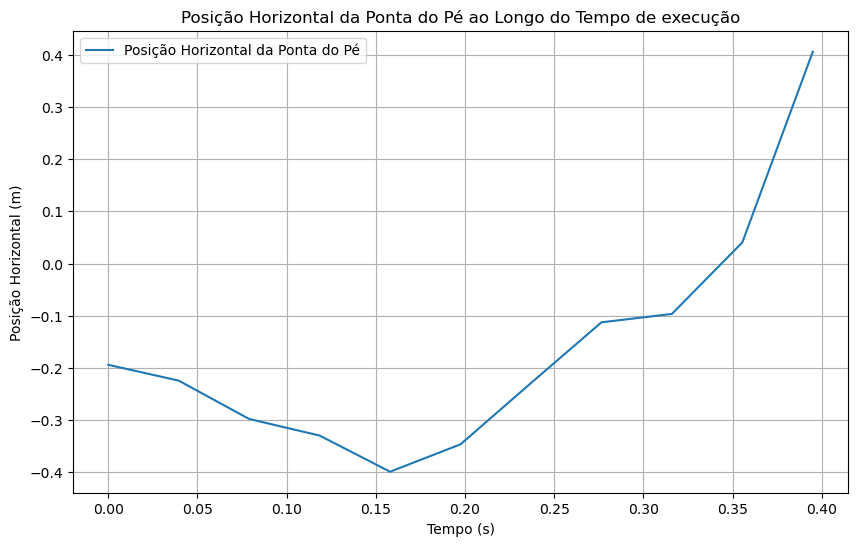

In [20]:
plt.figure(figsize=(10, 6))
plt.plot(tempo_exe, x_ponta_do_pe, label='Posição Horizontal da Ponta do Pé')
plt
plt.xlabel('Tempo (s)')
plt.ylabel('Posição Horizontal (m)')
plt.title('Posição Horizontal da Ponta do Pé ao Longo do Tempo de execução')
plt.legend()
plt.grid(True)
plt.show()

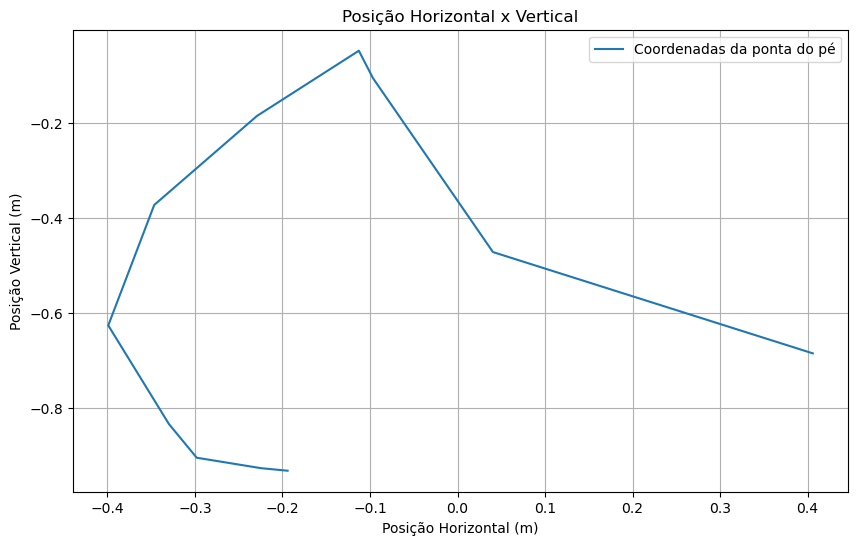

In [21]:
plt.figure(figsize=(10, 6))
plt.plot(x_ponta_do_pe, y_ponta_do_pe, label='Coordenadas da ponta do pé')
plt
plt.xlabel('Posição Horizontal (m)')
plt.ylabel('Posição Vertical (m)')
plt.legend()
plt.title('Posição Horizontal x Vertical')
plt.grid(True)
plt.show()

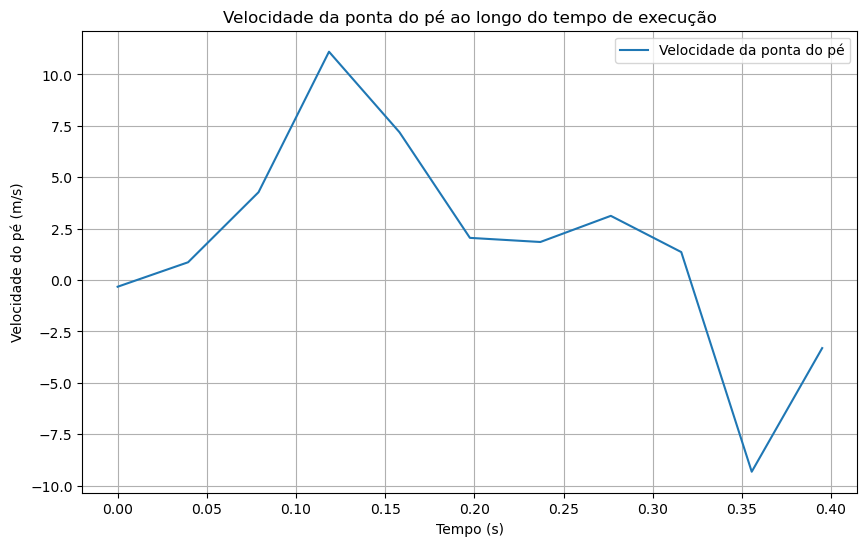

In [22]:
plt.figure(figsize=(10, 6))
plt.plot(tempo_exe, vel_P2, label='Velocidade da ponta do pé')
plt.xlabel('Tempo (s)')
plt.ylabel('Velocidade do pé (m/s)')
plt.title('Velocidade da ponta do pé ao longo do tempo de execução')
plt.legend()
plt.grid(True)
plt.show()

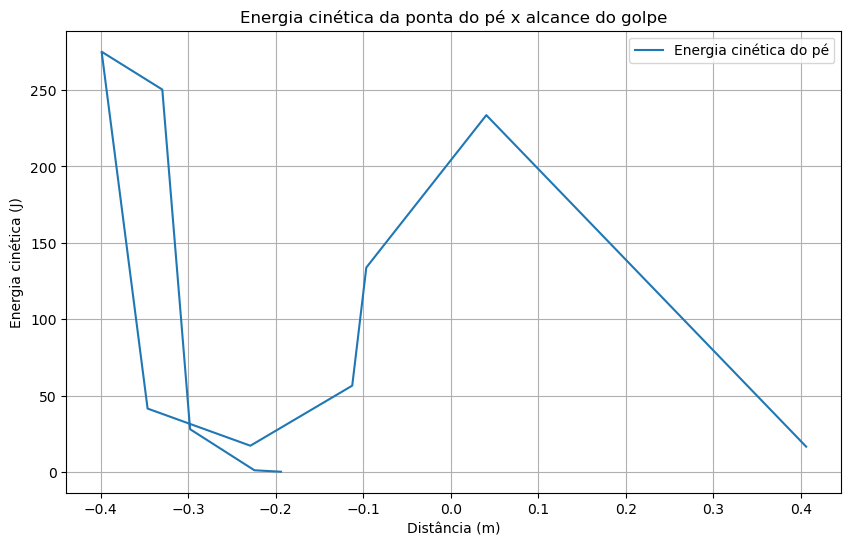

In [23]:
plt.figure(figsize=(10, 6))
plt.plot(x_ponta_do_pe, Ec_pe, label='Energia cinética do pé')
plt.xlabel('Distância (m)')
plt.ylabel('Energia cinética (J)')
plt.title('Energia cinética da ponta do pé x alcance do golpe')
plt.legend()
plt.grid(True)
plt.show()

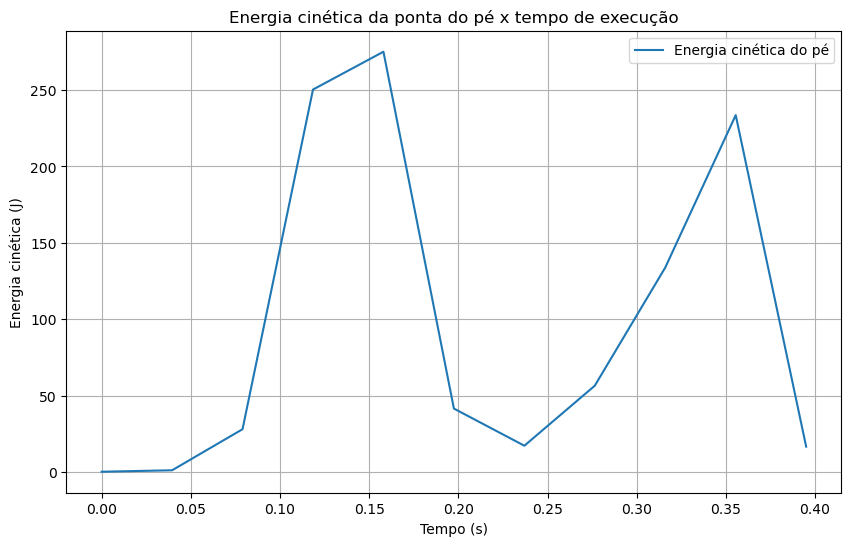

In [24]:
plt.figure(figsize=(10, 6))
plt.plot(tempo_exe, Ec_pe, label='Energia cinética do pé')
plt.xlabel('Tempo (s)')
plt.ylabel('Energia cinética (J)')
plt.title('Energia cinética da ponta do pé x tempo de execução')
plt.legend()
plt.grid(True)
plt.show()

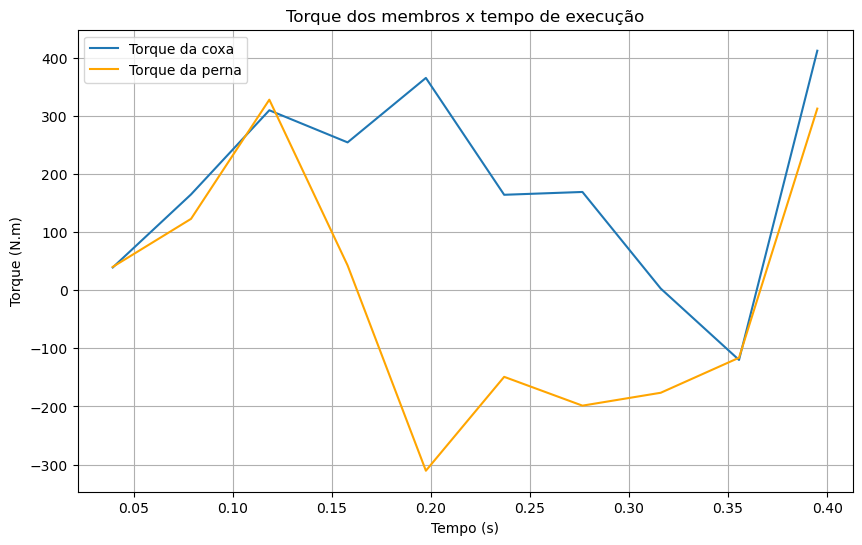

In [25]:
plt.figure(figsize=(10, 6))
plt.plot(tempo_exe2, solT1, label='Torque da coxa')
plt.plot(tempo_exe2, solT2, label='Torque da perna', color ='orange')
plt.xlabel('Tempo (s)')
plt.ylabel('Torque (N.m)')
plt.title('Torque dos membros x tempo de execução')
plt.legend()
plt.grid(True)
plt.show()

In [26]:
x_joelho = [] #coordenada x da ponta do pé ao longo do tempo
y_joelho = []
x_quadril = [0,0,0,0,0,0,0,0,0,0,0]
y_quadril = [0,0,0,0,0,0,0,0,0,0,0]


for i in range(0,11):
    x_joelho.append(P1.pos_from(O1).dot(N.x).subs({l1:l_1, l2:l_2, q1: float(ang_quad_preta[i]), q2:float(ang_joel_preta[i])}))
    y_joelho.append(P1.pos_from(O1).dot(N.y).subs({l1:l_1, l2:l_2, q1: float(ang_quad_preta[i]), q2:float(ang_joel_preta[i])}))

C:\Users\israe\AppData\Local\Temp\ipykernel_20168\3709522447.py:38: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  O1.set_data(x0_pos, y0_pos)
C:\Users\israe\AppData\Local\Temp\ipykernel_20168\3709522447.py:39: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  P1.set_data(x1_pos, y1_pos)
C:\Users\israe\AppData\Local\Temp\ipykernel_20168\3709522447.py:40: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  P2.set_data(x2_pos, y2_pos)


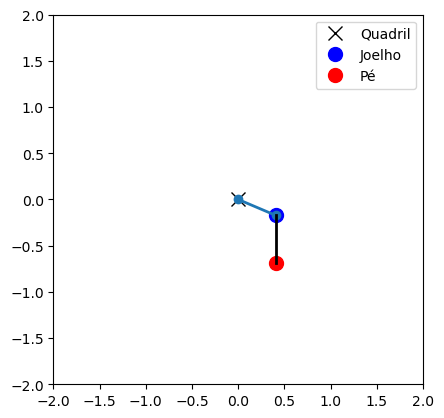

In [27]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

x_ponta = x_ponta_do_pe
y_ponta = y_ponta_do_pe

# Configuração da animação
fig, ax = plt.subplots()
ax.set_xlim(-2, 2)
ax.set_ylim(-2, 2)
ax.set_aspect('equal')

O1, = ax.plot([], [], 'x', color='black', markersize=10, label='Quadril')
P1, = ax.plot([], [], 'o', color='blue', markersize=10, label='Joelho')
P2, = ax.plot([], [], 'o', color='red', markersize=10, label='Pé')
line1, = ax.plot([], [], 'o-', lw=2)
line2, = ax.plot([], [], 'k-', lw=2)
ax.legend()

def init():
    O1.set_data([], [])
    P1.set_data([], [])
    P2.set_data([], [])
    line1.set_data([], [])
    line2.set_data([], [])
    return O1, P1, P2, line1, line2

def update(frame):
    x0_pos = x_quadril[frame]
    y0_pos = y_quadril[frame]
    x1_pos = x_joelho[frame]
    y1_pos = y_joelho[frame]
    x2_pos = x_ponta[frame]
    y2_pos = y_ponta[frame]

    O1.set_data(x0_pos, y0_pos)
    P1.set_data(x1_pos, y1_pos)
    P2.set_data(x2_pos, y2_pos)
    line1.set_data([x0_pos, x1_pos], [y0_pos, y1_pos])
    line2.set_data([x1_pos, x2_pos], [y1_pos, y2_pos])
    return O1, P1, P2, line1, line2

ani = FuncAnimation(fig, update, frames=len(x_quadril), init_func=init, blit=True, interval=500)

HTML(ani.to_jshtml(fps=3))

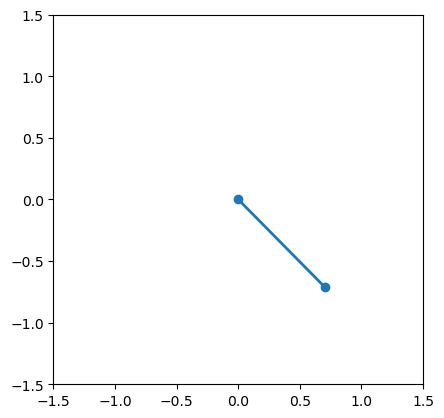

In [28]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Constantes do pêndulo
g = 9.81  # aceleração devido à gravidade (m/s^2)
L = 1.0   # comprimento do pêndulo (m)
theta0 = np.pi / 4  # ângulo inicial (radianos)
omega0 = 0.0        # velocidade angular inicial (rad/s)

# Função para calcular a posição do pêndulo
def pendulum(t, theta0, omega0, g, L):
    omega = np.sqrt(g / L)
    theta = theta0 * np.cos(omega * t) + (omega0 / omega) * np.sin(omega * t)
    return theta

# Configuração da animação
fig, ax = plt.subplots()
ax.set_xlim(-1.5*L, 1.5*L)
ax.set_ylim(-1.5*L, 1.5*L)
ax.set_aspect('equal')
line, = ax.plot([], [], 'o-', lw=2)

def init():
    line.set_data([], [])
    return line,

def update(frame):
    t = frame / 100  # escala para o tempo
    theta = pendulum(t, theta0, omega0, g, L)
    x = L * np.sin(theta)
    y = -L * np.cos(theta)
    line.set_data([0, x], [0, y])
    return line,

ani = FuncAnimation(fig, update, frames=range(1000), init_func=init, blit=True, interval=20)

HTML(ani.to_jshtml(fps=30))

NameError: name 'x' is not defined

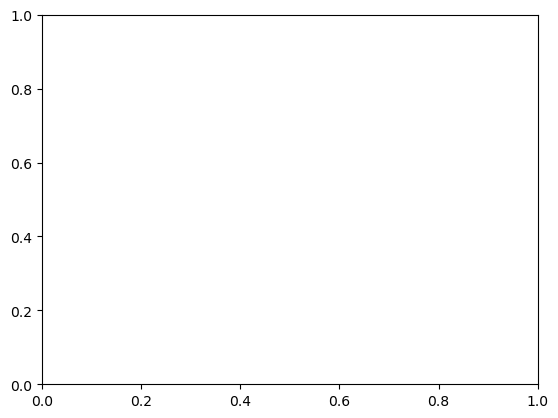

In [29]:
import matplotlib.animation as animation
from IPython.display import HTML

# Dados de exemplo

# Configuração do gráfico
fig, ax = plt.subplots()
line, = ax.plot(x, np.sin(x))

ax.set_xlim(0, 2 * np.pi)
ax.set_ylim(-1.5, 1.5)

# Função de animação
def animate(i):
    line.set_ydata(np.sin(x + i / 10.0))  # Atualize os dados da linha
    return line,

# Criar a animação
ani = animation.FuncAnimation(fig, animate, frames=100, interval=50, blit=True)

# Exibir a animação
HTML(ani.to_jshtml(fps=30))